#Brain MRI Classification

##Libraries

In [ ]:
import numpy as np # Importa a biblioteca NumPy, que fornece suporte para arrays e operações matemáticas de alto desempenho
import pandas as pd  # Importa a biblioteca Pandas, que fornece estruturas de dados e ferramentas de análise de dados
import matplotlib.pyplot as plt # Importa a biblioteca Matplotlib, que fornece suporte para visualização de dados

##Overall settings

In [ ]:
FINE_TUNING_EPOCHS = 24 # Número de épocas para o fine-tuning
TRAINING_EPOCHS = 10 # Número de épocas para o treinamento inicial do modelo
BATCH_SIZE = 32 # Tamanho do lote (número de amostras processadas juntas durante o treinamento)

#Uma época é uma passagem completa por todo o conjunto de treino.

image_height = 299 # Altura das imagens utilizadas como entrada no modelo
image_width = 299 # Largura das imagens utilizadas como entrada no modelo

##Load data

In [ ]:
import kagglehub #Em vez de dar Download do dataset, faz-se isto que é bem mais prático, principalemnte quando o dataset é muito pesado.
mateuszbuda_lgg_mri_segmentation_path = kagglehub.dataset_download('mateuszbuda/lgg-mri-segmentation')

print('Data source import complete.')

100%|██████████| 714M/714M [00:10<00:00, 68.7MB/s]

Extracting files...


Data source import complete.


In [ ]:
import glob #É uma biblioteca útil para procurar arquivos e diretórios com base em padrões de caminho.

# Inicializa uma lista vazia para armazenar os caminhos das imagens de ressonância magnética cerebral
brain_scans = []

# Utiliza a biblioteca glob para encontrar todos os arquivos de máscara no diretório especificado
mask_files = glob.glob('/root/.cache/kagglehub/datasets/mateuszbuda/lgg-mri-segmentation/versions/2/kaggle_3m/*/*_mask*') #Contem os caminhos das mascaras

# Para cada caminho de arquivo de máscara encontrado
for i in mask_files:
   # Substitui "_mask" no nome do arquivo pelo correspondente caminho da imagem sem a máscara
    brain_scans.append(i.replace('_mask','')) #Contem os caminhos das imagens originais

#Associar as mascaras às imagens de ressonancia magnetica de modo a criar um conjunto de dados "emparelhado"

In [ ]:
# Cria um DataFrame com as imagens e as máscaras correspondentes
data_df = pd.DataFrame({"image_path":brain_scans, "mask_path":mask_files})

#Organizar os caminhos das imagens e máscaras num formato tabular, de modo a facilitar o acesso e a manipulação posterior

In [ ]:
import cv2 # Importa a biblioteca OpenCV para ler e processar imagens

# Função que verifica se a máscara contém um tumor (valor maior que 0) ou não, ou seja se houver algo branco na máscara, significa que existe um tumor
def positive_negative_diagnosis(file_masks):
    mask = cv2.imread(file_masks) # Lê a máscara a partir do caminho do arquivo fornecido
    value = np.max(mask) # Obtém o valor máximo de pixel na máscara (geralmente o valor máximo será 255 se houver uma área significativa)

    # Se o valor máximo na máscara for maior que 0, significa que há algo positivo (como um tumor), a branco
    if value > 0:
        return 'Positive' # Diagnóstico positivo (presença de tumor)
    else:
        return 'Negative' # Diagnóstico negativo (ausência de tumor)

In [ ]:
# Aplica a função `positive_negative_diagnosis` às máscaras e cria uma nova coluna no DataFrame
# que contém 1 para imagens com tumor (diagnóstico positivo) e 0 para imagens sem tumor (diagnóstico negativo)
data_df["tumour"] = data_df["mask_path"].apply(lambda x: positive_negative_diagnosis(x))

In [ ]:
# Importa a função train_test_split da biblioteca sklearn para dividir os dados em subconjuntos
from sklearn.model_selection import train_test_split

# Divide o DataFrame `data_df` em conjuntos de treino e teste
# test_size=0.1 significa que 10% dos dados serão usados para o conjunto de teste
# A opção stratify garante que a distribuição das classes 'tumour' seja mantida em ambos os conjuntos
train_df, test_df  = train_test_split(data_df, test_size = 0.1, stratify = data_df['tumour'] )

# Divide o conjunto de treino em subconjuntos de treino e validação
# test_size=0.2 significa que 20% do conjunto de treino será usado para validação
# A opção stratify também garante que a distribuição das classes 'tumour' seja mantida nos conjuntos de treino e validação
# Ou seja, a proporção de 1s e 0s nos conjuntos será aproximadamente a mesma que a do conjunto original.
train_df, valid_df = train_test_split(train_df,test_size = 0.2, stratify = train_df['tumour'])

##Data generators

In [ ]:
# Bibliotecas de Deep Learning
import tensorflow as tf  # Importa o TensorFlow, uma das bibliotecas mais populares para deep learning.
import keras  # Importa o Keras, uma interface de alto nível para construir e treinar modelos de deep learning, que agora está integrado ao TensorFlow.
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Importa ImageDataGenerator para realizar pré-processamento de imagens e augmentação.
from tensorflow.keras import applications  # Importa módulos de arquiteturas de redes neurais pré-treinadas, como VGG, ResNet, etc.
from keras.models import Sequential, load_model  # Importa a classe Sequential para criar modelos empilhados e load_model para carregar modelos salvos.
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout  # Importa as camadas essenciais para redes neurais convolucionais.
from keras.preprocessing import image  # Importa funções de pré-processamento de imagens, como redimensionamento e normalização.
from tensorflow.keras.utils import image_dataset_from_directory  # Importa uma função para carregar imagens de diretórios de forma eficiente.
import matplotlib.pyplot as plt  # Importa o matplotlib para visualização de gráficos.
from sklearn.metrics import roc_curve  # Importa a função para calcular a curva ROC (Receiver Operating Characteristic).
from sklearn.metrics import auc  # Importa a função para calcular a área sob a curva (AUC).

In [ ]:
train_df

,image_path,mask_path,tumour
2372,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,Negative
2724,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,Negative
1616,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,Negative
1430,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,Negative
3014,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,Positive
...,...,...,...
404,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,Negative
1543,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,Negative
2577,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,Negative
3178,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,Negative


In [ ]:
# Data augmentation and pre-processing using tensorflow
# Criação do objeto ImageDataGenerator que irá aplicar aumento de dados (data augmentation)
# e pré-processamento nas imagens de treinamento
gen = ImageDataGenerator(
    rescale         = 1./255.,  # Normaliza os valores dos pixels das imagens para o intervalo [0, 1], dividindo por 255
    horizontal_flip = True,     # Aplica uma transformação de espelhamento horizontal nas imagens de forma aleatória
    vertical_flip   = True,     # Aplica uma transformação de espelhamento vertical nas imagens de forma aleatória
    zoom_range      = 0.05,     # Aplica um zoom aleatório nas imagens, variando até 5% do tamanho da imagem
    rotation_range  = 25        # Aplica uma rotação aleatória nas imagens, variando até 25 graus em qualquer direção
)

# Criação do gerador de dados (train_generator) para fornecer as imagens e labels aumentadas durante o treinamento
train_generator = gen.flow_from_dataframe(
    train_df,  # DataFrame que contém os caminhos das imagens e as labels correspondentes
    directory   = '',  # Diretório onde as imagens estão localizadas (não necessário já que os caminhos completos estão no DataFrame)
    x_col       = 'image_path',  # Nome da coluna no DataFrame que contém os caminhos das imagens
    y_col       = 'tumour',      # Nome da coluna no DataFrame que contém as labels (se a imagem tem ou não tumor)
    color_mode  = "rgb",  # Define que as imagens são coloridas e possuem 3 canais (RGB)
    target_size = (image_height, image_width),  # Redimensiona todas as imagens para o tamanho especificado (altura e largura)
    class_mode  = "categorical",  # Define que a tarefa é de classificação categórica, ou seja, one-hot encoding será aplicado nas labels
    batch_size  = BATCH_SIZE,  # Define o tamanho do lote (quantas imagens serão processadas por vez)
    shuffle = True,  # Embaralha as imagens para evitar que o modelo aprenda padrões relacionados à ordem das imagens
    seed = 42  # Define uma semente para garantir que o embaralhamento seja reproduzível
)

Found 2828 validated image filenames belonging to 2 classes.


In [ ]:
# Data augmentation and pre-processing using tensorflow
# Criar uma instância da classe ImageDataGenerator para o pré-processamento dos dados de validação e teste
test_gen = ImageDataGenerator(rescale = 1./255.)  # Normalizar os valores dos pixels para o intervalo [0, 1]

# Criar o gerador de validação a partir do dataframe de validação (valid_df)
validation_generator = test_gen.flow_from_dataframe(
    valid_df,  # O dataframe que contém os dados de validação
    directory   = '',  # O diretório onde as imagens estão localizadas (deixado vazio, porque os caminhos completos estão fornecidos no dataframe)
    x_col       = 'image_path',  # Coluna do dataframe que contém os caminhos das imagens
    y_col       = 'tumour',  # Coluna do dataframe que contém as etiquetas (presença de tumor)
    color_mode  = "rgb",  # Formato de cor das imagens (RGB neste caso)
    target_size = (image_height, image_width),  # Redimensionando todas as imagens para as dimensões especificadas
    class_mode  = "categorical", # Modo de classe como categórica, para codificação one-hot
    batch_size  = BATCH_SIZE,  # O número de imagens a serem processadas em cada lote
    shuffle     = True,  # Embaralhar as imagens antes de as passar para o modelo
    seed        = 42  # Semente para a geração de números aleatórios, garantindo reprodutibilidade
)

# Criar o gerador de teste a partir do dataframe de teste (test_df)
test_generator = test_gen.flow_from_dataframe(
    test_df,  # O dataframe que contém os dados de teste
    directory   = '',  # O diretório onde as imagens estão localizadas
    x_col       = 'image_path',  # Coluna do dataframe que contém os caminhos das imagens
    y_col       = 'tumour',  # Coluna do dataframe que contém as etiquetas
    color_mode  = "rgb",  # Formato de cor das imagens
    target_size = (image_height, image_width),  # Redimensionando todas as imagens para o tamanho alvo
    class_mode  = "categorical",  # Modo de classe como categórica, para codificação one-hot
    batch_size  = BATCH_SIZE,  # Número de imagens a processar em cada lote
    shuffle     = False  # Não é necessário embaralhar os dados de teste, pois queremos que a ordem se mantenha a mesma para a avaliação
)

Found 708 validated image filenames belonging to 2 classes.
Found 393 validated image filenames belonging to 2 classes.


In [ ]:
# Obter os índices das classes no gerador de treino
a = train_generator.class_indices
class_names = list(a.keys())  # Armazenar os nomes das classes numa lista

In [ ]:
class_names

['Negative', 'Positive']

In [ ]:
# Calcular a frequência de classes nos conjuntos de treino, validação e teste

# Para o conjunto de treino:
train_freq = np.unique(train_generator.classes, return_counts=True)
# np.unique encontra os valores únicos no array 'train_generator.classes', que contém os índices das classes atribuídos pelo gerador.
# return_counts=True retorna também o número de ocorrências de cada classe (frequência).
# Resultado: Uma tupla (array de classes únicas, array com a contagem de cada classe).

# Para o conjunto de validação:
validation_freq = np.unique(validation_generator.classes, return_counts=True)
# Faz a mesma operação que acima, mas para o gerador de validação (validation_generator).

# Para o conjunto de teste:
test_freq = np.unique(test_generator.classes, return_counts=True)
# Também aplica o np.unique para calcular a frequência de classes no gerador de teste (test_generator).

# A partir dessas variáveis (train_freq, validation_freq, test_freq), podemos visualizar o balanceamento dos dados
# nos três conjuntos (treino, validação e teste), analisando as frequências de cada classe.

([<matplotlib.patches.Wedge at 0x7ca62f703700>,
 [Text(-0.5036938852080531, 0.9779020758767295, 'Negative'),
  Text(0.503693885208053, -0.9779020758767296, 'Positive')],
 [Text(-0.27474211920439257, 0.5334011322963979, '65.1%'),
  Text(0.2747421192043925, -0.5334011322963979, '34.9%')])

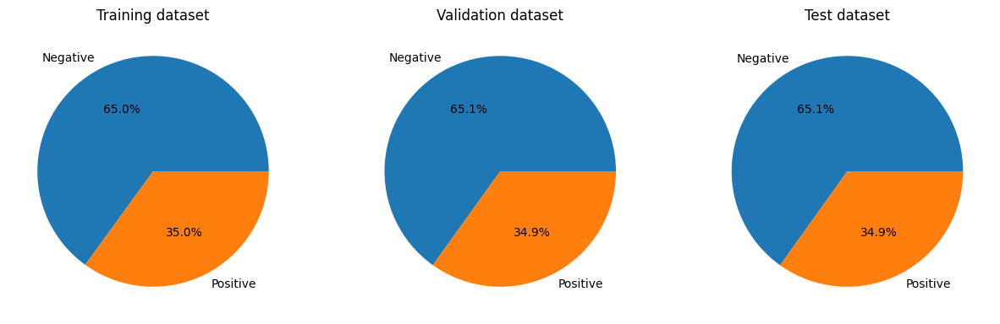

In [ ]:
# Criar gráficos de pizza para visualizar a distribuição de classes nos conjuntos de treino, validação e teste.

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
# Cria uma figura com 1 linha e 3 colunas de subplots (graficos).
# figsize define o tamanho da figura (15 unidades de largura por 5 de altura).

# Gráfico para o conjunto de treino:
ax[0].set_title("Training dataset")
# Define o título do primeiro subplot como "Training dataset".
ax[0].pie(train_freq[1], labels=class_names, autopct='%1.1f%%')
# Cria um gráfico de pizza:
# - `train_freq[1]` contém as frequências de cada classe no conjunto de treino.
# - `labels=class_names` atribui os nomes das classes como rótulos no gráfico.
# - `autopct='%1.1f%%'` exibe a porcentagem de cada classe no gráfico com uma casa decimal.

# Gráfico para o conjunto de validação:
ax[1].set_title("Validation dataset")
# Define o título do segundo subplot como "Validation dataset".
ax[1].pie(validation_freq[1], labels=class_names, autopct='%1.1f%%')
# Mesmo procedimento, mas usando os dados de validação (`validation_freq[1]`).

# Gráfico para o conjunto de teste:
ax[2].set_title("Test dataset")
# Define o título do terceiro subplot como "Test dataset".
ax[2].pie(test_freq[1], labels=class_names, autopct='%1.1f%%')
# Mesmo procedimento, mas usando os dados de teste (`test_freq[1]`).

# Gráficos de pizza, que mostram a distribuição percentual das classes
# em cada conjunto de dados (treino, validação e teste). Isso permite verificar visualmente o balanceamento dos conjuntos.

In [ ]:
# Detecção de desbalanceamento e cálculo de pesos para classes
from sklearn.utils.class_weight import compute_class_weight

# Calcular os pesos das classes para lidar com desbalanceamento no conjunto de treino.
class_weights = compute_class_weight( # é usado para calcular automaticamente os pesos das classes, ajustando-os para que classes menos frequentes recebam maior peso.
    class_weight="balanced",  # Método para balancear as classes automaticamente.
    classes=np.unique(train_generator.classes),  # Lista de classes únicas no conjunto de treino.
    y=train_generator.classes  # As classes presentes no conjunto de treino (frequências).
)

# Converter o array retornado num dicionário onde cada classe está associada ao seu peso.
class_weights = dict(zip(np.unique(train_generator.classes), class_weights))


In [ ]:
class_weights # contém os pesos calculados para cada classe, que podem ser usados durante o treinamento.

# Isso ajuda o modelo a não favorecer classes majoritárias, melhorando o aprendizado em conjuntos desbalanceados.

{0: 0.7688961392060902, 1: 1.4297269969666329}

In [ ]:
def plot_images_with_metadata(img, true_labels, predictions=None, filenames=None):
    """
    Plota imagens com rótulos verdadeiros e informações adicionais, como ID do paciente e slice number.

    Args:
        img (array): Batch de imagens.
        true_labels (array): Rótulos verdadeiros das imagens.
        predictions (array, optional): Predições do modelo. Defaults to None.
        filenames (list, optional): Lista com os nomes dos arquivos de imagem. Defaults to None.
    """
    plt.figure(figsize=[12, 18])  # Configura o tamanho da figura para exibição.

    for i in range(min(24, len(img))):  # Exibe até 24 imagens ou menos, dependendo do batch.
        plt.subplot(6, 4, i + 1)  # Cria um grid de 6 linhas por 4 colunas.
        plt.imshow(img[i])  # Mostra a imagem da posição `i`.
        plt.axis('off')  # Remove os eixos para melhor visualização.

        # Extrair informações do nome do arquivo se disponível
        if filenames:
            file_name = filenames[i].split('/')[-1]  # Nome do arquivo sem o caminho
            patient_id, slice_number = file_name.split('_')[2], file_name.split('_')[3].split('.')[0]
            metadata = f"ID: {patient_id}, Slice: {slice_number}"
        else:
            metadata = "Metadata not available"

        # Exibir rótulos e predições (se disponíveis)
        if predictions is not None:
            plt.title(
                "{}\n{} {:.1f}%\n{}".format(
                    class_names[np.argmax(true_labels[i])],  # Nome da classe verdadeira.
                    class_names[np.argmax(predictions[i])],  # Nome da classe prevista.
                    100 * np.max(predictions[i]),  # Probabilidade da classe prevista (em porcentagem).
                    metadata  # Informações adicionais (ID e Slice).
                ),
                fontsize=8
            )
        else:
            plt.title(
                "{}\n{}".format(
                    class_names[np.argmax(true_labels[i])],  # Nome da classe verdadeira.
                    metadata  # Informações adicionais (ID e Slice).
                ),
                fontsize=8
            )

    plt.tight_layout()
    plt.show()


##Sample Images

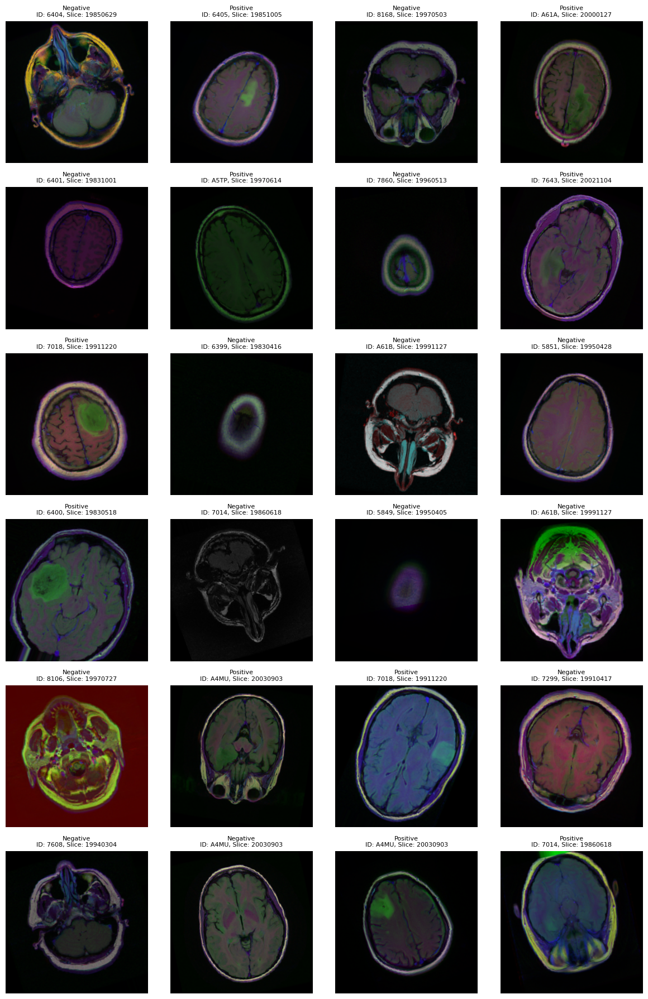

In [ ]:
test_generator.reset()
x, y = next(train_generator) # Obtém o próximo batch de imagens e rótulos do gerador de treino
filenames = train_generator.filenames[:len(x)]  # Obter os nomes dos arquivos correspondentes ao batch atual
plot_images_with_metadata(x, y, filenames=filenames) # Plota as imagens do batch com seus rótulos verdadeiros

In [ ]:
# Função para plotar o histórico de treinamento (precisão e perda)
def plot_history(history):
    # Armazena os resultados extraídos do histórico do modelo
    acc = history.history['accuracy']  # Precisão do treinamento ao longo das épocas
    val_acc = history.history['val_accuracy']  # Precisão de validação ao longo das épocas
    loss = history.history['loss']  # Perda (loss) do treinamento
    val_loss = history.history['val_loss']  # Perda de validação ao longo das épocas

    # Identificar a melhor época (com base na menor validação de perda)
    best_epoch_loss = np.argmin(val_loss)  # A época com a menor perda de validação
    best_epoch_acc = np.argmax(val_acc)  # A época com a maior precisão de validação

    # Plotando os resultados
    plt.figure(figsize=(8, 6))  # Tamanho inicial da figura do gráfico
    plt.rcParams['font.size'] = 10  # Define o tamanho da fonte no gráfico
    plt.rcParams['axes.grid'] = True  # Habilita a grade no fundo do gráfico para melhor leitura
    plt.rcParams['figure.facecolor'] = 'white'  # Define a cor de fundo da figura como branca

    # Criando o gráfico da precisão
    plt.subplot(2, 1, 1)  # Define que este gráfico será na primeira posição do layout 2x1
    plt.plot(acc, label='Training Accuracy')  # Plota a precisão do treinamento
    plt.plot(val_acc, label='Validation Accuracy')  # Plota a precisão da validação
    plt.scatter(best_epoch_acc, val_acc[best_epoch_acc], color='red', marker='x', label="Best Epoch (Acc)")  # Marca a melhor época com cruz vermelha
    plt.legend(loc='lower right')  # Adiciona a legenda no canto inferior direito
    plt.ylabel('Accuracy')  # Define o rótulo do eixo y como "Accuracy"
    plt.title(f'\nTraining and Validation Accuracy. \nTrain Accuracy: {str(round(acc[-1],3))}\nValidation Accuracy: {str(round(val_acc[-1],3))}')  # Adiciona o título, mostrando a precisão final do treinamento e validação

    # Criando o gráfico da perda (loss)
    plt.subplot(2, 1, 2)  # Define que este gráfico será na segunda posição do layout 2x1
    plt.plot(loss, label='Training Loss')  # Plota a perda do treinamento
    plt.plot(val_loss, label='Validation Loss')  # Plota a perda da validação
    plt.scatter(best_epoch_loss, val_loss[best_epoch_loss], color='red', marker='x', label="Best Epoch (Loss)")  # Marca a melhor época com cruz vermelha
    plt.legend(loc='upper right')  # Adiciona a legenda no canto superior direito
    plt.ylabel('Cross Entropy')  # Define o rótulo do eixo y como "Cross Entropy"
    plt.title(f'Training and Validation Loss. \nTrain Loss: {str(round(loss[-1],3))}\nValidation Loss: {str(round(val_loss[-1],3))}')  # Adiciona o título, mostrando a perda final do treinamento e validação
    plt.xlabel('epoch')  # Define o rótulo do eixo x como "epoch"

    # Ajusta o layout para evitar sobreposição dos gráficos e melhora a estética
    plt.tight_layout(pad=3.0)
    # Exibe os gráficos
    plt.show()

In [ ]:
# Importa a biblioteca seaborn para visualização e confusion_matrix de sklearn para calcular a matriz de confusão.
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Função para plotar a matriz de confusão com informações de sensibilidade e especificidade.
def plot_confusion_matrix(y_true, y_pred, class_names, ax, title):
    # Calcula a matriz de confusão entre os rótulos verdadeiros (y_true) e os rótulos previstos (y_pred)
    cm = confusion_matrix(y_true, y_pred)

    # Calcula a sensibilidade (recall) e a especificidade usando a matriz de confusão.
    # Sensibilidade: Verdadeiros Positivos / (Verdadeiros Positivos + Falsos Negativos)
    sensitivity = cm[1,1] / (cm[1,0] + cm[1,1])

    # Especificidade: Verdadeiros Negativos / (Verdadeiros Negativos + Falsos Positivos)
    specificity = cm[0,0] / (cm[0,0] + cm[0,1])

    # Atualiza o título para incluir os valores de sensibilidade e especificidade
    new_title = f'{title}\n Sensitivity = {sensitivity:.2f} Specificity = {specificity:.2f}'

    # Cria um mapa de calor (heatmap) da matriz de confusão.
    sns.heatmap(
        cm,  # A matriz de confusão.
        annot=True,  # Exibe os valores dentro das células.
        square=True,  # Mantém o gráfico com formato quadrado.
        xticklabels=class_names,  # Rótulos para o eixo x (classes previstas).
        yticklabels=class_names,  # Rótulos para o eixo y (classes reais).
        fmt='d',  # Formato de exibição dos valores como inteiros.
        cmap=plt.cm.Blues,  # Usa a paleta de cores 'Blues'.
        cbar=False,  # Desativa a barra de cores.
        ax=ax)  # Especifica o eixo onde o gráfico será exibido.

    # Define o título do gráfico, com a sensibilidade e a especificidade, e ajusta o tamanho da fonte.
    ax.set_title(new_title, fontsize=12)

    # Ajusta os rótulos do eixo x (rótulos das classes previstas) para que fiquem inclinados para melhor visualização.
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

    # Adiciona os rótulos aos eixos x e y.
    ax.set_ylabel('True Label', fontsize=10)
    ax.set_xlabel('Predicted Label', fontsize=10)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# Função suplementar para mostrar o relatório de classificação juntamente com a matriz de confusão
def generate_report(model, generator, class_names, model_name):
    y_true = generator.classes  # Rótulos verdadeiros
    y_pred = model.predict(generator).argmax(axis=1)  # Rótulos previstos

    # Relatório de classificação
    print("\nRelatório de Classificação - Modelo " + model_name + ":")
    # Relatório de classificação como string (evita a exibição duplicada)
    report = classification_report(y_true, y_pred, target_names=class_names)
    print(report) #Mostra o relatorio

    # Matriz de confusão
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

    plt.title("Matriz de Confusão do Modelo: " + model_name) #Titulo fornecido como parametro
    plt.ylabel("True Label")  # Rótulo do eixo Y
    plt.xlabel("Predicted Label")  # Rótulo do eixo X
    plt.show()

    return report

##Grad-Cam (XAI)

In [ ]:
# Importa o módulo 'cm' da Matplotlib, que contém colormap para visualização de gradientes.
from matplotlib import cm

# Função para gerar o mapa de calor do Grad-CAM (Gradient-weighted Class Activation Mapping).
def make_gradcam_heatmap(image, model, last_conv_layer_name):

    # Expande as dimensões da imagem para compatibilidade com o modelo (batch size de 1).
    img_array = tf.expand_dims(image, axis=0)

    # Salva a ativação da última camada do modelo e desativa a função de ativação da última camada para obter os logits.
    last_layer_activation = model.layers[-1].activation
    model.layers[-1].activation = None

    # Cria um modelo grad_model que recebe como entrada a imagem e retorna as ativações da última camada convolucional
    # e as previsões de saída do modelo.
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Calcula o gradiente da classe prevista em relação às ativações da última camada convolucional.
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)  # Obtemos as ativações e as previsões.
        pred_index = tf.argmax(preds[0])  # Obtém o índice da classe prevista.
        class_channel = preds[:, pred_index]  # Obtém a probabilidade da classe prevista.

    # Calcula o gradiente da classe prevista em relação à última camada convolucional.
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Calcula a média do gradiente ao longo das dimensões (altura, largura, canais).
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Obtém a saída da última camada convolucional para a imagem de entrada.
    last_conv_layer_output = last_conv_layer_output[0]

    # Multiplica cada canal da camada de ativação pela importância do canal, com base no gradiente,
    # e soma todos os canais para obter o mapa de calor.
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normaliza o mapa de calor entre 0 e 1 para visualização.
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()  # Converte para um array NumPy.

    # Redimensiona o mapa de calor para o intervalo de 0-255 (para representar como imagem).
    heatmap = np.uint8(255 * heatmap)

    # Usa o colormap 'jet' para colorir o mapa de calor, aplicando uma paleta de cores do gradiente.
    jet = cm.get_cmap("jet")

    # Obtém os valores RGB do colormap 'jet' para o intervalo [0, 255].
    jet_colors = jet(np.arange(256))[:, :3]

    # Aplica a coloração do mapa de calor à imagem, gerando uma versão colorida do mapa de calor.
    jet_heatmap = jet_colors[heatmap]

    # Converte o mapa de calor colorido em uma imagem e redimensiona para o tamanho da imagem original.
    jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img_array[0].shape[1], img_array[0].shape[0]))
    jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)

    # Superpõe o mapa de calor sobre a imagem original, ajustando a transparência.
    superimposed_img = jet_heatmap * 0.4 + img_array[0] * 255

    # Converte a imagem final superposta de volta para o formato de imagem do Keras.
    superimposed_img = tf.keras.utils.array_to_img(superimposed_img)

    # Restaura a ativação original da última camada para o modelo.
    model.layers[-1].activation = last_layer_activation

    # Retorna a imagem final com o mapa de calor sobreposto.
    return superimposed_img



    # A função retorna uma imagem original com um mapa de calor (Grad-CAM) sobreposto, destacando as regiões da imagem
    # que mais influenciam a decisão do modelo. Esse tipo de visualização é útil para interpretar modelos de aprendizado
    # profundo, permitindo que vejamos quais partes da imagem o modelo considera mais importantes para suas previsões.

##Model

In [ ]:
# Importa a classe Model da Keras para criar um novo modelo.
from tensorflow.keras.models import Model

# Função para criar um modelo com base em uma rede pré-treinada (base_model).
def create_model(base_model):

    # A saída da base_model é passada como entrada para a nova parte do modelo.
    x = base_model.output

    # Aplica Global Average Pooling para reduzir a dimensionalidade.
    # Isso calcula a média de cada canal, mantendo apenas uma média por canal.
    x = GlobalAveragePooling2D()(x)

    # Adiciona uma camada densa com 128 unidades e função de ativação ReLU.
    x = Dense(128, activation='relu')(x)

    # Aplica dropout com taxa de 0.4 para regularização, evitando overfitting.
    x = Dropout(0.4)(x)

    # Adiciona outra camada densa com 64 unidades e função de ativação ReLU.
    x = Dense(64, activation='relu')(x)

    # Aplica dropout com taxa de 0.2 para regularização adicional.
    x = Dropout(0.2)(x)

    # Adiciona a camada de saída com uma função de ativação softmax para classificação multiclasse.
    # A quantidade de unidades na camada de saída é o número de classes.
    outputs = Dense(len(class_names), activation='softmax')(x)

    # Cria o modelo final, conectando a entrada da base_model com a saída definida acima.
    model = Model(base_model.inputs, outputs)

    # Retorna o modelo criado.
    return model

In [ ]:
# Função para treinar um modelo com opções de fine-tuning
def fit_model(model, base_model, epochs, fine_tune = 0):

    # Definindo o callback de EarlyStopping para parar o treinamento quando a melhoria da métrica de validação for muito pequena
    early = tf.keras.callbacks.EarlyStopping(
        patience=3,  # Número de épocas sem melhoria antes de parar
        min_delta=0.001,  # Mudança mínima na métrica para considerar uma melhoria
        restore_best_weights=True  # Restaura os melhores pesos do modelo quando a melhoria parar
    )

    # Exibe o número de camadas que serão descongeladas para fine-tuning
    print("Unfreezing number of layers in base model = ", fine_tune)

    # Fine-tuning: ajusta o modelo com base no parâmetro `fine_tune`
    if fine_tune > 0:
        # Se fine-tune for maior que 0, torna a base_model treinável
        base_model.trainable = True

        # Congela as camadas da base_model, exceto as últimas `fine_tune` camadas
        for layer in base_model.layers[:-fine_tune]:
            layer.trainable = False

        # Compila o modelo com uma taxa de aprendizado pequena para fine-tuning
        model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),  # Taxa de aprendizado baixa
                      loss='categorical_crossentropy',  # Função de perda para múltiplas classes
                      metrics=['accuracy'])  # Métrica de precisão
    else:
        # Se não for feito fine-tuning, congela todas as camadas da base_model
        base_model.trainable = False

        # Compila o modelo com a taxa de aprendizado padrão do Adam
        model.compile(optimizer=tf.keras.optimizers.Adam(),
                      loss='categorical_crossentropy',  # Função de perda para múltiplas classes
                      metrics=['accuracy'])  # Métrica de precisão

    # Explicação sobre a função de perda:
    # A perda `categorical_crossentropy` é usada em problemas de classificação multi-classe,
    # onde temos várias classes para prever. Esta função calcula a diferença entre
    # a previsão do modelo e os rótulos verdadeiros.

    # Ajuste do modelo: inicia o treinamento do modelo com os dados de treino e validação
    history = model.fit(train_generator,  # Dados de treinamento
                        validation_data=validation_generator,  # Dados de validação
                        epochs=epochs,  # Número de épocas de treinamento
                        callbacks=[early],  # Usa o callback de early stopping
                        class_weight=class_weights)  # Pesos das classes, úteis para dados desbalanceados

    # Retorna o histórico de treinamento, que contém métricas como perda e precisão durante o treinamento
    return history

##InceptionResNetV2

In [ ]:
# Carregar a arquitetura InceptionResNetV2 com pesos pré-treinados no ImageNet, sem a camada de classificação superior
inception_base_model = tf.keras.applications.InceptionResNetV2(
    include_top=False,  # Não inclui a camada superior (a camada de classificação)
    weights='imagenet',  # Usa os pesos pré-treinados no ImageNet
    input_shape=(image_height, image_width, 3)  # Define a forma de entrada (altura, largura e 3 canais de cor)
)

# Congelar as camadas do modelo base, ou seja, não atualizá-las durante o treinamento
# Isso significa que as camadas da InceptionResNetV2 não serão treinadas, mas sim usadas como extratores de características.
# A camada de classificação superior será treinada no modelo final.
inception_model = create_model(inception_base_model)  # Criar um modelo usando a base da InceptionResNetV2

# Treinar o modelo com o conjunto de dados (geradores de treino e validação)
history = fit_model(inception_model, inception_base_model, epochs=TRAINING_EPOCHS)  # Passa o modelo e o número de épocas para treinamento

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


89/89 ━━━━━━━━━━━━━━━━━━━━ 161s 1s/step - accuracy: 0.6468 - loss: 0.6552 - val_accuracy: 0.7500 - val_loss: 0.4538
Epoch 2/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 84s 818ms/step - accuracy: 0.7416 - loss: 0.5136 - val_accuracy: 0.7542 - val_loss: 0.4501
Epoch 3/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 73s 766ms/step - accuracy: 0.7648 - loss: 0.4746 - val_accuracy: 0.7514 - val_loss: 0.4437
Epoch 4/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 78s 830ms/step - accuracy: 0.7632 - loss: 0.4469 - val_accuracy: 0.7571 - val_loss: 0.4014
Epoch 5/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 77s 762ms/step - accuracy: 0.7627 - loss: 0.4559 - val_accuracy: 0.7867 - val_loss: 0.4035
Epoch 6/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 72s 763ms/step - accuracy: 0.7707 - loss: 0.4365 - val_accuracy: 0.7754 - val_loss: 0.3973
Epoch 7/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 77s 822ms/step - accuracy: 0.7652 - loss: 0.4255 - val_accuracy: 0.7641 - val_loss: 0.3939
Epoch 8/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 73s 775ms/step - accuracy: 0.7597 - loss: 0.4138 - val_accuracy: 0.7797 

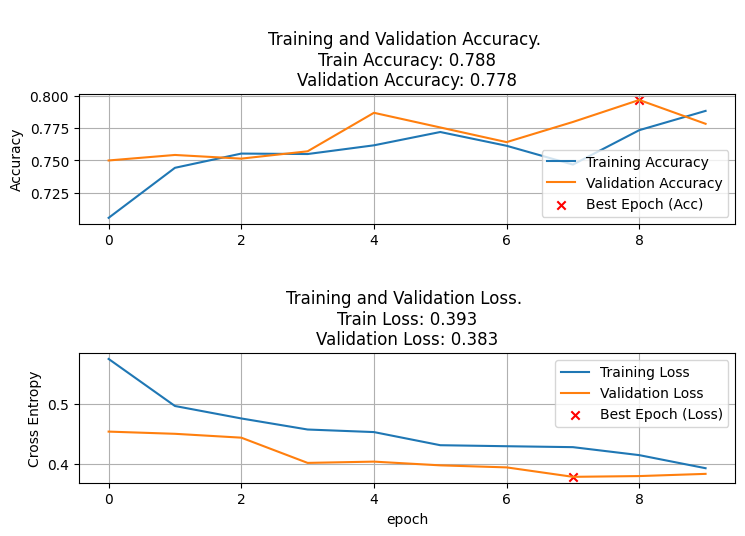

In [ ]:
plot_history(history)

13/13 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step

Relatório de Classificação - Modelo InceptionResNetV2 (antes de Fine-tuning):
              precision    recall  f1-score   support

    Negative       0.89      0.75      0.82       256
    Positive       0.64      0.83      0.73       137

    accuracy                           0.78       393
   macro avg       0.77      0.79      0.77       393
weighted avg       0.81      0.78      0.79       393



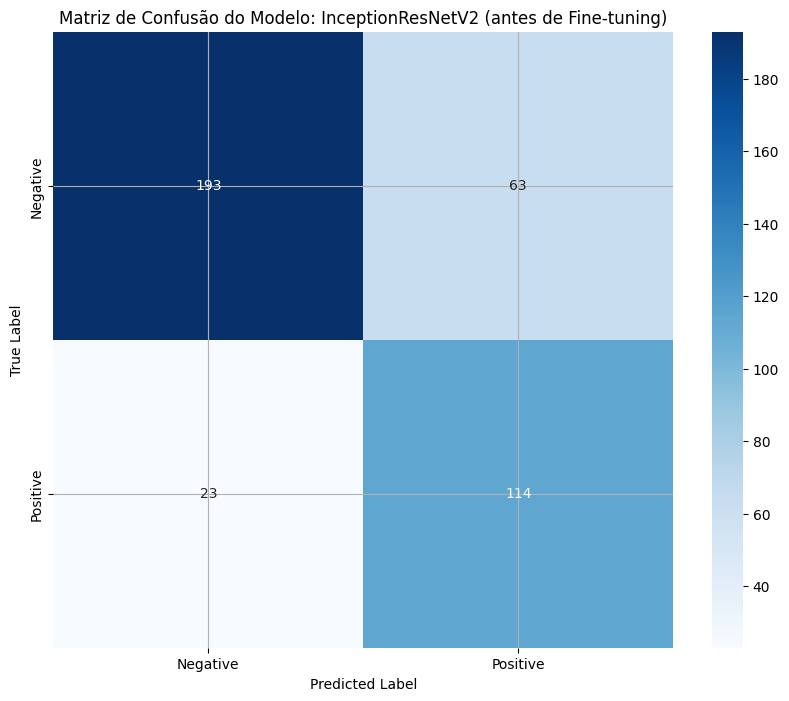

In [ ]:
Relatorio = generate_report(inception_model, test_generator, class_names, "InceptionResNetV2 (antes de Fine-tuning)")

###Fine-tuning

In [ ]:
# Descongelar as camadas do modelo base
nr_base_layers = len(inception_base_model.layers)  # Contagem do número total de camadas no modelo base (InceptionResNetV2)
print("Inception base layers = ", nr_base_layers)  # Exibe o número total de camadas no modelo base

# Treinar o modelo, descongelando um número específico de camadas no modelo base
# fine_tune = int(nr_base_layers/4) descongela um quarto das camadas do modelo base para fine-tuning
history = fit_model(inception_model, inception_base_model, epochs=FINE_TUNING_EPOCHS, fine_tune=int(nr_base_layers/4))

Inception base layers =  780
Unfreezing number of layers in base model =  195
Epoch 1/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 195s 1s/step - accuracy: 0.7529 - loss: 0.5756 - val_accuracy: 0.7839 - val_loss: 0.3901
Epoch 2/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 126s 832ms/step - accuracy: 0.7821 - loss: 0.4145 - val_accuracy: 0.8093 - val_loss: 0.3564
Epoch 3/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 85s 909ms/step - accuracy: 0.8209 - loss: 0.3558 - val_accuracy: 0.8333 - val_loss: 0.3143
Epoch 4/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 82s 872ms/step - accuracy: 0.8309 - loss: 0.3320 - val_accuracy: 0.8658 - val_loss: 0.2803
Epoch 5/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 139s 826ms/step - accuracy: 0.8525 - loss: 0.3015 - val_accuracy: 0.8771 - val_loss: 0.2721
Epoch 6/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 80s 848ms/step - accuracy: 0.8851 - loss: 0.2598 - val_accuracy: 0.8856 - val_loss: 0.2487
Epoch 7/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 81s 853ms/step - accuracy: 0.8930 - loss: 0.2339 - val_accuracy: 0.8941 - val_loss: 0.2641
Epoch 8/24
89/89 ━━

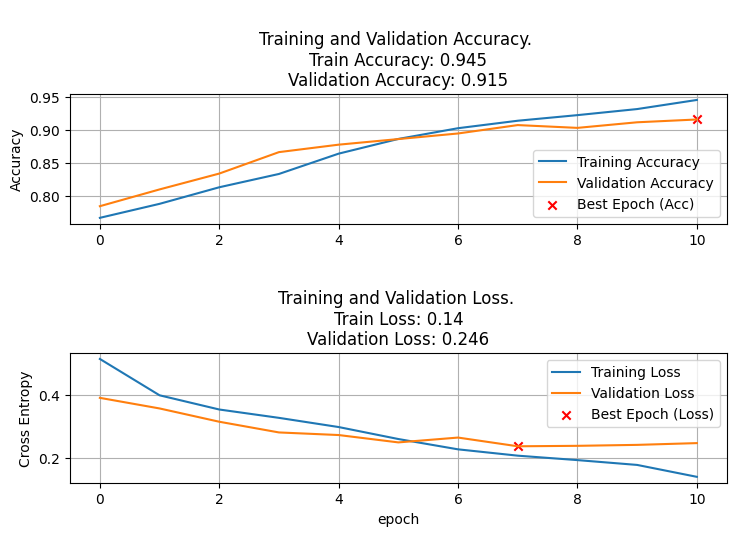

In [ ]:
 plot_history(history)

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step

Relatório de Classificação - Modelo InceptionResNetV2 (após Fine-tuning):
              precision    recall  f1-score   support

    Negative       0.90      0.92      0.91       256
    Positive       0.84      0.81      0.83       137

    accuracy                           0.88       393
   macro avg       0.87      0.86      0.87       393
weighted avg       0.88      0.88      0.88       393



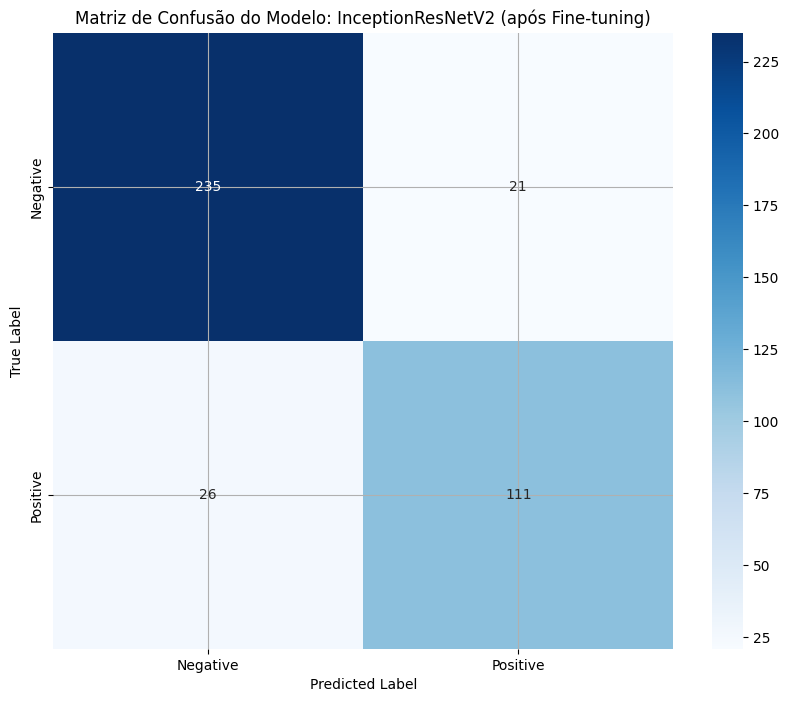

In [ ]:
Relatorio = generate_report(inception_model, test_generator, class_names, "InceptionResNetV2 (após Fine-tuning)")

In [ ]:
# Avalia o desempenho do modelo no conjunto de dados de teste usando o gerador de dados de teste (test_generator)
accuracy_score = inception_model.evaluate(test_generator)

print(accuracy_score) # Resultados da avaliação
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

13/13 ━━━━━━━━━━━━━━━━━━━━ 8s 628ms/step - accuracy: 0.8657 - loss: 0.2866
[0.263435959815979, 0.8804070949554443]
Accuracy: 88.04%
Loss: 0.263


In [ ]:
# Realiza previsões com o modelo treinado para permitir o cálculo da matriz de confusão posteriormente

# Reinicia o gerador de teste para garantir que começamos do início do conjunto de dados
test_generator.reset()

# Usa o modelo para prever os rótulos do conjunto de dados de teste
inception_test_preds = inception_model.predict(test_generator)

# Converte as probabilidades previstas para rótulos de classe, através do índice da maior probabilidade prevista
inception_test_pred_classes = np.argmax(inception_test_preds, axis=1)

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 269ms/step


In [ ]:
# Calcula os valores da curva ROC (Taxa de Falsos Positivos, Taxa de Verdadeiros Positivos e limiares) para a classe positiva (classe 1)
fpr_inception, tpr_inception, thresholds_inception = roc_curve(test_generator.classes, inception_test_preds[:,1])

# Calcula a Área Sob a Curva (AUC) para a curva ROC
auc_inception = auc(fpr_inception, tpr_inception)

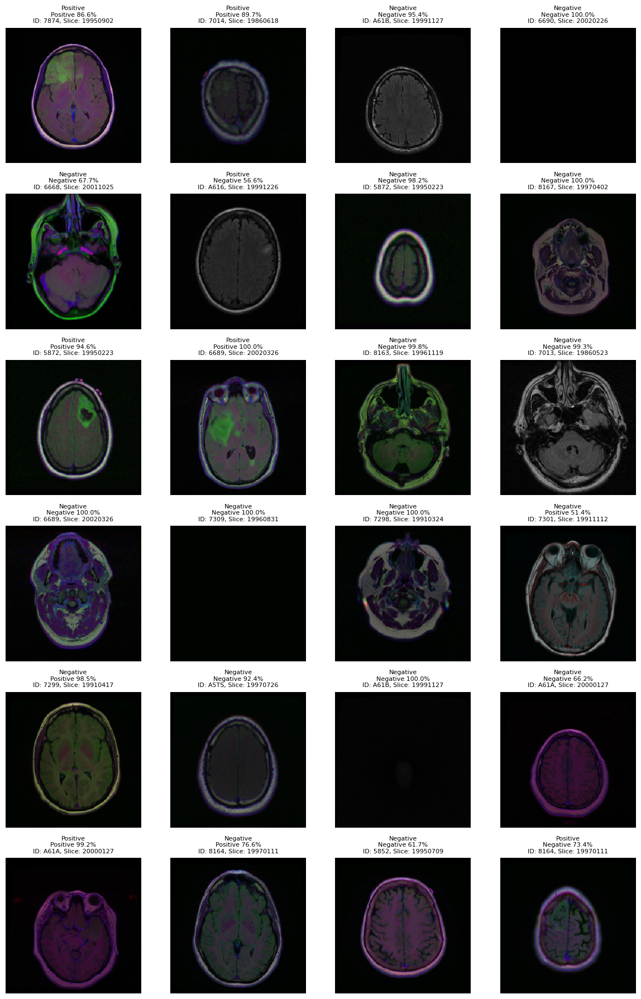

In [ ]:
# Reinicia o test generator para começar do primeiro batch
test_generator.reset()

# Obtém o próximo lote de imagens (x) e seus rótulos verdadeiros correspondentes (y) do test generator
x, y = next(test_generator)
filenames = test_generator.filenames[:len(x)]

# Plota as imagens juntamente com seus rótulos verdadeiros (y) e rótulos previstos (inception_test_preds)
plot_images_with_metadata(x, y, inception_test_preds, filenames=filenames)

<ipython-input-24-cee0e4c66c32>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


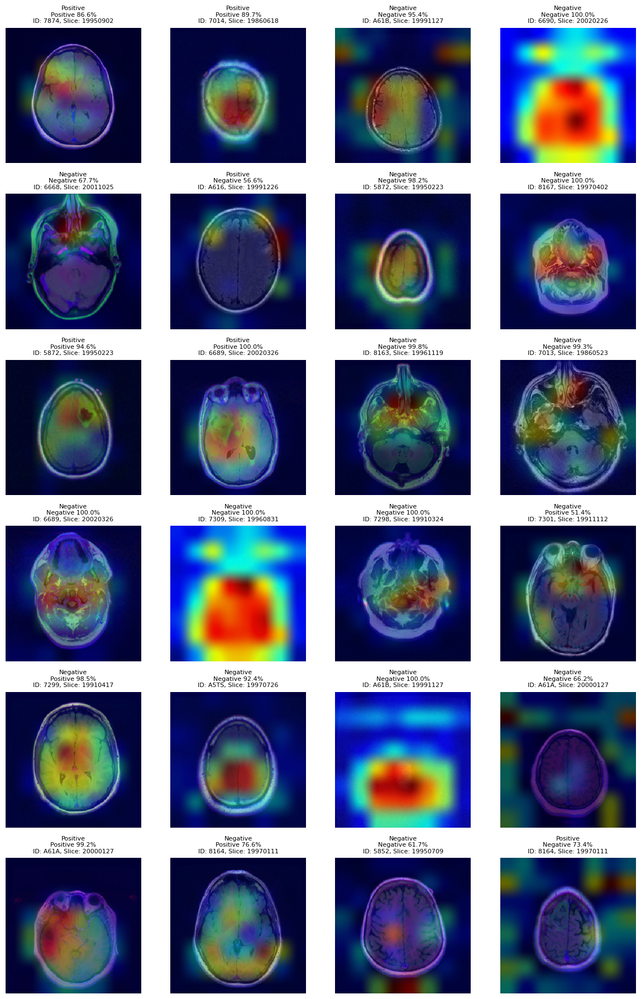

In [ ]:
# Define o nome da última camada convolucional da arquitetura InceptionResNetV2
# para gerar os heatmaps usando Grad-CAM.
last_conv_layer_name = "conv_7b_ac"

# Inicializa uma lista vazia para armazenar os heatmaps gerados.
heatmaps = []

# Itera sobre cada imagem no batch fornecido.
for img in x:
    # Gera o heatmap da imagem atual usando a função `make_gradcam_heatmap`.
    # Esta função utiliza a camada convolucional especificada e a arquitetura do modelo.
    heatmap = make_gradcam_heatmap(img, inception_model, last_conv_layer_name)

    # Adiciona o heatmap gerado à lista `heatmaps`.
    heatmaps.append(heatmap)

# Exibe os heatmaps gerados junto com as informações adicionais
plot_images_with_metadata(heatmaps, y, inception_test_preds, filenames = filenames)

##VGG16

In [ ]:
# Carrega a arquitetura do VGG16 com pesos treinados no ImageNet, sem a camada final (topo)
vgg16_base_model = tf.keras.applications.vgg16.VGG16(
                             include_top = False,  # Não inclui a camada final de classificação (classificador)
                             weights = 'imagenet',  # Utiliza pesos pré-treinados no ImageNet
                             input_shape = (image_height, image_width, 3)  # Define a forma de entrada das imagens (altura, largura e 3 canais de cor)
                             )

# Congelando as camadas do modelo base, ou seja, suas características internas não serão alteradas durante o treinamento
# Isso significa que os pesos treináveis do modelo não serão atualizados durante o método fit()
# O estado do modelo também não será alterado, o que ajuda a evitar overfitting, especialmente quando se usa um modelo pré-treinado
# para tarefas específicas sem alterar suas camadas convolucionais
vgg16_model = create_model(vgg16_base_model)  # Cria um novo modelo usando o modelo base VGG16

# Resumo do modelo
#vgg16_model.summary()

# Treina o modelo criado utilizando o método fit_model
# Passa o modelo VGG16, o modelo base congelado e o número de épocas de treinamento
history = fit_model(vgg16_model, vgg16_base_model, epochs = TRAINING_EPOCHS)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - accuracy: 0.6524 - loss: 0.6563 - val_accuracy: 0.7444 - val_loss: 0.5305
Epoch 2/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 87s 829ms/step - accuracy: 0.7548 - loss: 0.4957 - val_accuracy: 0.7316 - val_loss: 0.5299
Epoch 3/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 81s 804ms/step - accuracy: 0.7486 - loss: 0.4861 - val_accuracy: 0.7556 - val_loss: 0.4840
Epoch 4/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 82s 794ms/step - accuracy: 0.7612 - loss: 0.4753 - val_accuracy: 0.7514 - val_loss: 0.4456
Epoch 5/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 76s 804ms/step - accuracy: 0.7320 - loss: 0.4908 - val_accuracy: 0.7571 - val_loss: 0.4552
Epoch 6/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 70s 748ms/step - accuracy: 0.7370 - loss: 0.4757 - val_accuracy: 0.7373 - val_loss: 0.4721
Epoch 7/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 71s 740ms/step - accuracy: 0.7523 - loss: 0.4599 - val_accuracy: 0.7528 - val_loss: 0.4553


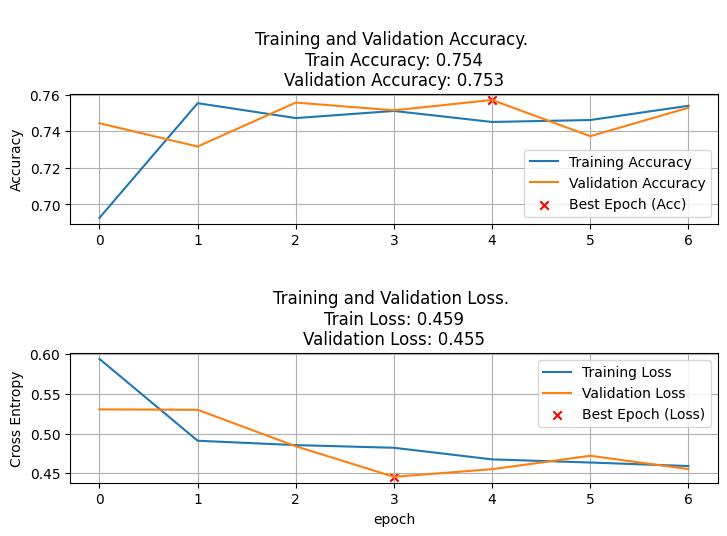

In [ ]:
plot_history(history)

13/13 ━━━━━━━━━━━━━━━━━━━━ 13s 993ms/step

Relatório de Classificação - Modelo VGG16 (antes de Fine-tuning):
              precision    recall  f1-score   support

    Negative       0.84      0.76      0.80       256
    Positive       0.62      0.72      0.67       137

    accuracy                           0.75       393
   macro avg       0.73      0.74      0.73       393
weighted avg       0.76      0.75      0.75       393



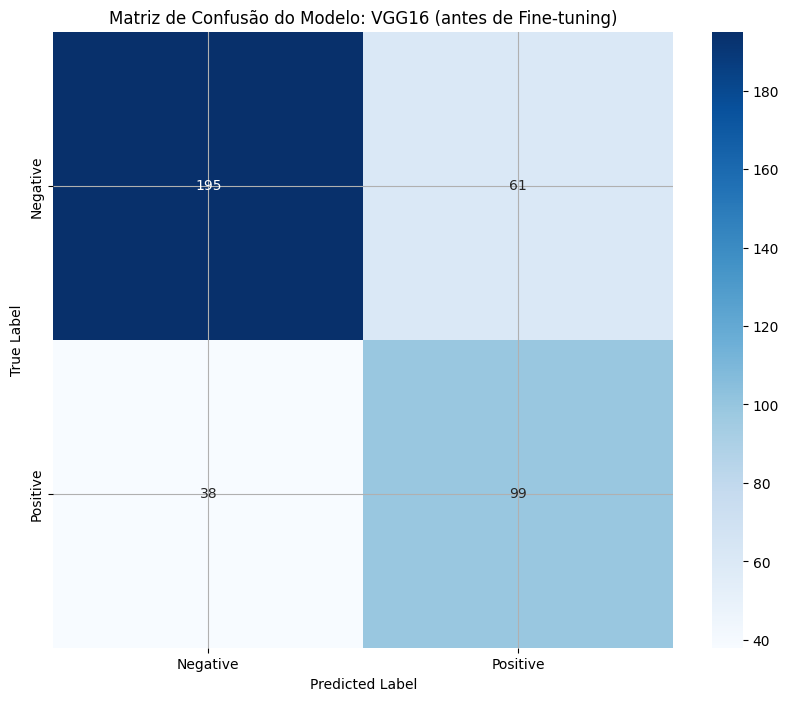

In [ ]:
Relatorio = generate_report(vgg16_model, test_generator, class_names, "VGG16 (antes de Fine-tuning)")

###Fine-tuning

In [ ]:
# Descongelar as camadas do modelo base (VGG16)
# Isto significa que agora as camadas do modelo base serão treináveis e os pesos serão atualizados durante o treinamento.
nr_base_layers = len(vgg16_base_model.layers)  # Obtém o número total de camadas no modelo base VGG16
print("VGG16 base layers = ", nr_base_layers)  # Exibe o número de camadas do modelo base

# Fine-tuning
# A função `fit_model` agora é chamada com o argumento `fine_tune`, que define quantas camadas do modelo base devem ser treinadas.
# Neste caso, vai descongelar (permitir treinamento) das camadas de uma parte do modelo base.
# Especificamente, ajusta o parametro `fine_tune` para a quarta parte das camadas base, ou seja,
# as últimas camadas do VGG16. Isso permite que o modelo faça ajustes finos nas camadas superiores sem perder o conhecimento
# aprendido nas camadas inferiores.
history = fit_model(vgg16_model, vgg16_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

VGG16 base layers =  19
Unfreezing number of layers in base model =  4
Epoch 1/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 86s 829ms/step - accuracy: 0.7794 - loss: 0.4473 - val_accuracy: 0.7528 - val_loss: 0.4577
Epoch 2/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 73s 775ms/step - accuracy: 0.7615 - loss: 0.4428 - val_accuracy: 0.7712 - val_loss: 0.4226
Epoch 3/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 73s 762ms/step - accuracy: 0.7670 - loss: 0.4344 - val_accuracy: 0.7627 - val_loss: 0.4284
Epoch 4/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 73s 777ms/step - accuracy: 0.7551 - loss: 0.4253 - val_accuracy: 0.7754 - val_loss: 0.4161
Epoch 5/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 82s 777ms/step - accuracy: 0.8015 - loss: 0.3866 - val_accuracy: 0.8178 - val_loss: 0.3514
Epoch 6/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 82s 765ms/step - accuracy: 0.8062 - loss: 0.3794 - val_accuracy: 0.8150 - val_loss: 0.3628
Epoch 7/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 82s 769ms/step - accuracy: 0.8137 - loss: 0.3642 - val_accuracy: 0.8277 - val_loss: 0.3378
Epoch 8/24
89/89 ━━━━━━━━━

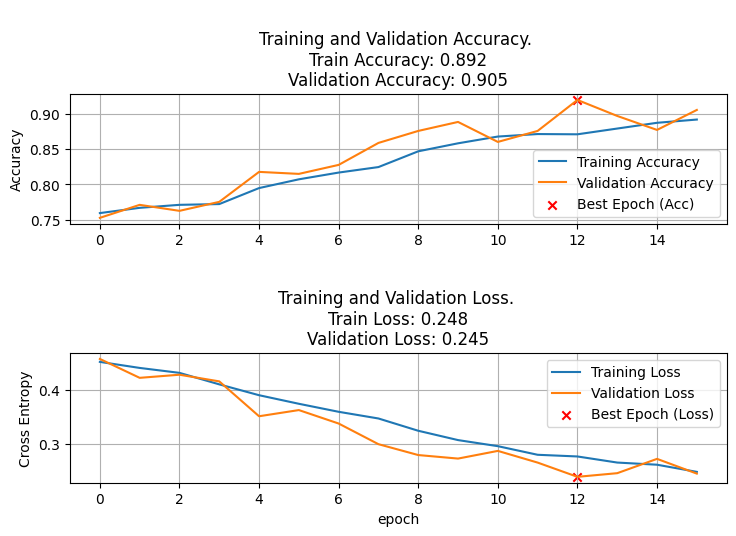

In [ ]:
plot_history(history)

13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step

Relatório de Classificação - Modelo VGG16 (após Fine-tuning):
              precision    recall  f1-score   support

    Negative       0.94      0.90      0.92       256
    Positive       0.83      0.88      0.86       137

    accuracy                           0.90       393
   macro avg       0.88      0.89      0.89       393
weighted avg       0.90      0.90      0.90       393



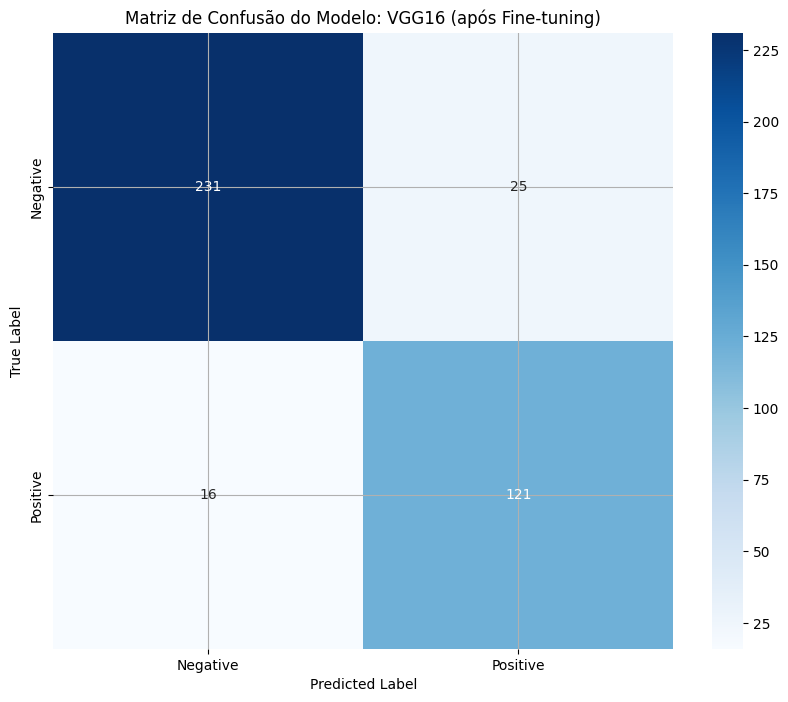

In [ ]:
Relatorio = generate_report(vgg16_model, test_generator, class_names, "VGG16 (após Fine-tuning)")

In [ ]:
# Avalia o modelo com o conjunto de dados de teste (test_generator)
# O método evaluate retorna uma lista com a perda e as métricas de avaliação, como a acurácia.
accuracy_score = vgg16_model.evaluate(test_generator)  # Avaliação do modelo com o gerador de dados de teste

# Exibe o resultado da avaliação, que contém a perda (loss) e a acurácia
print(accuracy_score)  # Exibe todas as métricas retornadas, onde o primeiro valor é a perda e o segundo é a acurácia

# Exibe a acurácia formatada como uma porcentagem
# O índice 1 da lista `accuracy_score` corresponde à acurácia, e multiplicamos por 100 para exibir como porcentagem.
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))

# Exibe a perda formatada com 3 casas decimais
# O índice 0 da lista `accuracy_score` corresponde à perda.
print("Loss: {:.3f}".format(accuracy_score[0]))

13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - accuracy: 0.8913 - loss: 0.2593
[0.25313282012939453, 0.8956742882728577]
Accuracy: 89.57%
Loss: 0.253


In [ ]:
# Realiza previsões no conjunto de dados de teste para permitir o cálculo da matriz de confusão posteriormente
# É importante não embaralhar as previsões, caso contrário, não conseguimos mapear corretamente as previsões para os rótulos verdadeiros.
# O gerador de dados de teste é resetado para garantir que o modelo passe por todas as amostras do conjunto de teste de forma sequencial.
test_generator.reset()

# Realiza as previsões no conjunto de dados de teste usando o modelo VGG16 treinado
# O método `predict` gera as probabilidades das classes para cada imagem no conjunto de teste.
vgg16_test_preds = vgg16_model.predict(test_generator)

# Converte as probabilidades para classes, utilizando `np.argmax` para obter o índice da classe com maior probabilidade.
# O eixo 1 corresponde às probabilidades para cada classe. `np.argmax` retorna o índice da classe com a maior probabilidade para cada imagem.
vgg16_test_pred_classes = np.argmax(vgg16_test_preds, axis=1)

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 235ms/step


In [ ]:
# Calcula a curva ROC (Receiver Operating Characteristic) para o modelo VGG16
# A função `roc_curve` calcula as taxas de falso positivo (FPR) e verdadeiro positivo (TPR) para diferentes limiares.
# O primeiro argumento é o vetor de rótulos verdadeiros (test_generator.classes), e o segundo argumento são as previsões do modelo.
# Como estamos a lidar com uma classificação binária (ou com probabilidades de classe), escolhemos a coluna de probabilidades da classe 1 (vgg16_test_preds[:, 1]),
# que contém as probabilidades de que cada amostra pertença à classe positiva.
fpr_vgg16, tpr_vgg16, thresholds_vgg16 = roc_curve(test_generator.classes, vgg16_test_preds[:, 1])

# Calcula a AUC (Area Under the Curve) da curva ROC, que fornece uma medida de desempenho do modelo.
# A AUC é um valor entre 0 e 1, onde 1 significa desempenho perfeito e 0.5 significa um modelo sem discriminabilidade.
auc_vgg16 = auc(fpr_vgg16, tpr_vgg16)

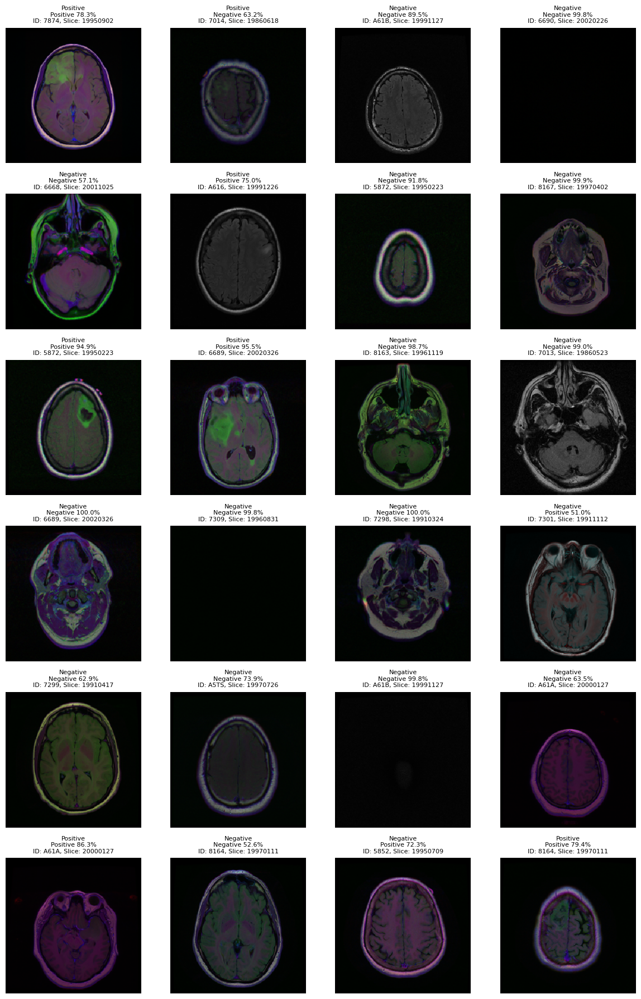

In [ ]:
# Reset o gerador de dados de teste (test_generator) para garantir que ele percorra todas as imagens novamente
# sem embaralhar a ordem. Isso é importante para garantir que a visualização dos resultados corresponda
# às imagens que estamos exibindo, e para não perdermos o mapeamento entre as imagens e as previsões.
test_generator.reset()

# Obtém um lote de imagens (x) e os rótulos verdadeiros (y) do gerador de dados de teste.
# `next(test_generator)` retorna uma tupla (imagens, rótulos), onde `x` são as imagens e `y` são os rótulos.
x, y = next(test_generator)

# Exibe as imagens junto com os rótulos verdadeiros (y) e as previsões do modelo (vgg16_test_preds).
# O `plot_images` é uma função personalizada (que você deve ter implementado) que provavelmente plota as imagens
# com as informações associadas a elas, como rótulos verdadeiros e previsões.
# As previsões do modelo (vgg16_test_preds) são usadas para mostrar qual classe o modelo previu para cada imagem.
plot_images_with_metadata(x, y, vgg16_test_preds, filenames = filenames)

<ipython-input-24-cee0e4c66c32>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


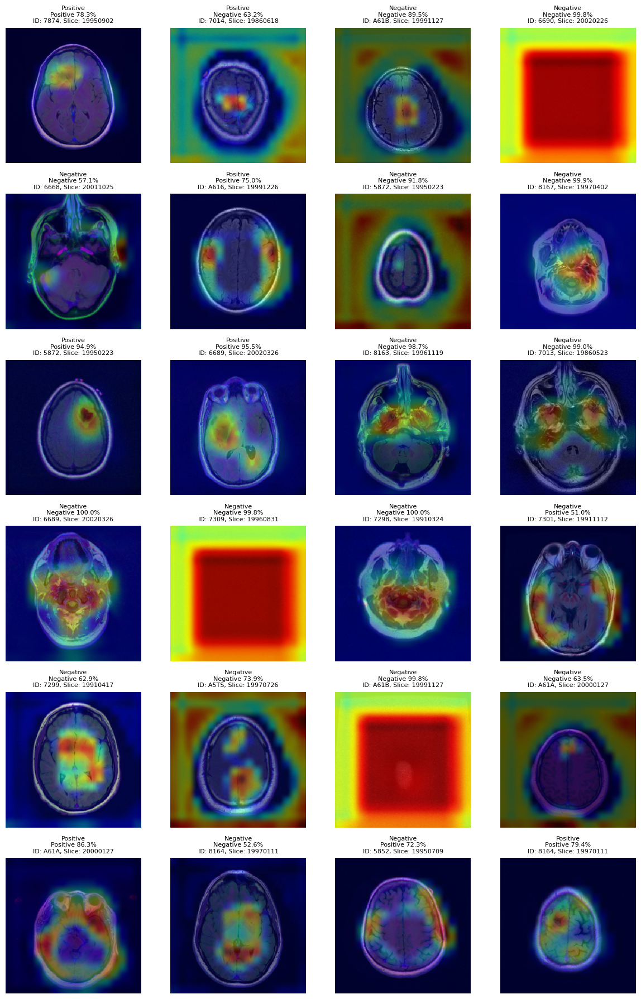

In [ ]:
# Grad-CAM (Gradient-weighted Class Activation Mapping) gera um mapa de ativação
# para visualizar quais regiões da imagem influenciaram a decisão do modelo.
last_conv_layer_name = "block5_conv3"

# Inicializando uma lista para armazenar os mapas de calor (heatmaps) gerados para cada imagem.
heatmaps = []

# Iterando sobre as imagens `x` para gerar um mapa de calor para cada uma
# Cada imagem em `x` é passada para a função `make_gradcam_heatmap`, que calcula o mapa de calor para a imagem.
for img in x:
    # Gerando o mapa de calor Grad-CAM para a imagem, com base no modelo VGG16 e na última camada convolucional
    heatmap = make_gradcam_heatmap(img, vgg16_model, last_conv_layer_name)

    # Adicionando o mapa de calor gerado à lista `heatmaps`
    heatmaps.append(heatmap)

# Exibindo as imagens com seus respectivos mapas de calor, rótulos verdadeiros e previsões
# A função `plot_images` será responsável por exibir as imagens junto com os rótulos verdadeiros e as previsões.
plot_images_with_metadata(heatmaps, y, vgg16_test_preds, filenames = filenames)

##Xpection

In [ ]:
# Carrega a arquitetura Xception com pesos do ImageNet como base
xception_base_model = tf.keras.applications.xception.Xception(
    include_top=False,  # Exclui as camadas finais da rede (camada densa), pois vamos usar o proprio classificador
    weights='imagenet',  # Inicializa com os pesos pré-treinados no ImageNet
    input_shape=(image_height, image_width, 3)  # Define o tamanho de entrada das imagens (altura, largura e 3 canais para RGB)
)

# Congela as camadas do modelo base para evitar que seus pesos sejam atualizados durante o treinamento
# Isso significa que o estado interno das camadas (os pesos) não será alterado durante o treinamento.
# A atualização dos pesos do modelo será feita apenas nas camadas após a base (modelo 'Xception').
xception_model = create_model(xception_base_model)  # Cria o modelo usando a função 'create_model', que inclui o modelo base e as camadas adicionais

#xception_model.summary()  # Exibe o resumo do modelo, mostrando todas as camadas e parâmetros do modelo

# Inicia o treinamento do modelo com as imagens de treino e validação e ajusta as camadas treináveis
history = fit_model(xception_model, xception_base_model, epochs=TRAINING_EPOCHS)  # Treina o modelo pelo número de épocas definidas em TRAINING_EPOCHS nas primeiras celulas deste notebook

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 110s 927ms/step - accuracy: 0.6842 - loss: 0.5714 - val_accuracy: 0.7669 - val_loss: 0.4218
Epoch 2/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 69s 732ms/step - accuracy: 0.7679 - loss: 0.4568 - val_accuracy: 0.7655 - val_loss: 0.4275
Epoch 3/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 94s 1s/step - accuracy: 0.7714 - loss: 0.4204 - val_accuracy: 0.7839 - val_loss: 0.3863
Epoch 4/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 69s 736ms/step - accuracy: 0.7969 - loss: 0.4172 - val_accuracy: 0.8023 - val_loss: 0.3798
Epoch 5/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 82s 720ms/step - accuracy: 0.8078 - loss: 0.3746 - val_accuracy: 0.8023 - val_loss: 0.3973
Epoch 6/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 81s 735ms/step - accuracy: 0.8056 - loss: 0.3794 - val_accuracy: 0.8121 - val_loss: 0.3652
Epoch 7/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 68s 723ms/step - accuracy: 0.8070 - loss: 0.3618 - val_accuracy: 0.8234 - val_loss: 0.3378
E

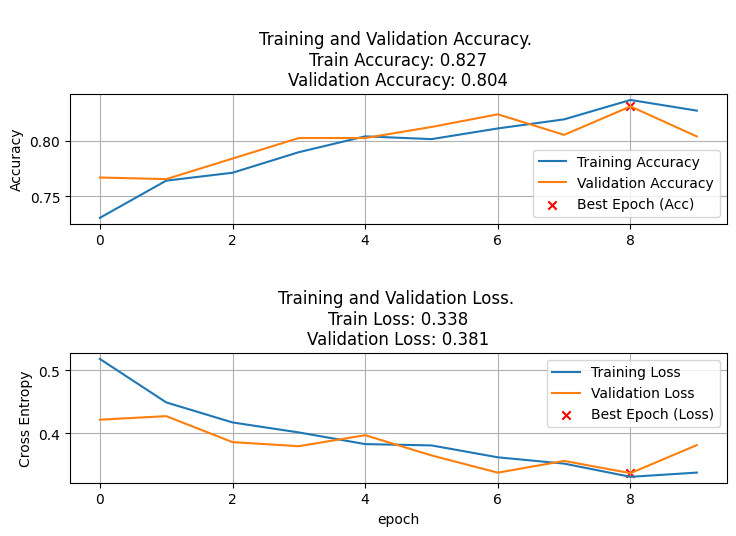

In [ ]:
plot_history(history)

13/13 ━━━━━━━━━━━━━━━━━━━━ 13s 909ms/step

Relatório de Classificação - Modelo Xception (antes de Fine-tuning):
              precision    recall  f1-score   support

    Negative       0.93      0.80      0.86       256
    Positive       0.71      0.89      0.79       137

    accuracy                           0.83       393
   macro avg       0.82      0.85      0.82       393
weighted avg       0.85      0.83      0.84       393



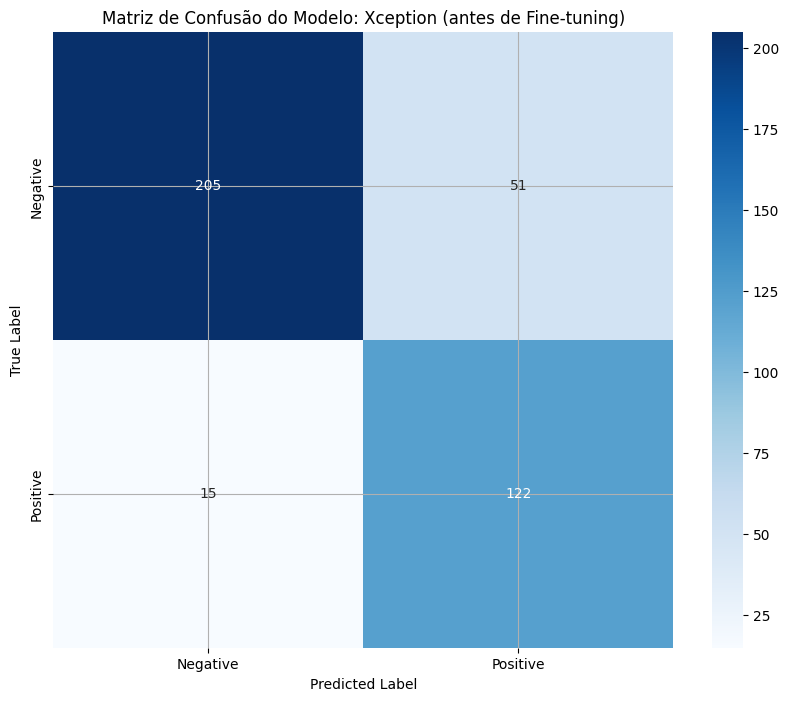

In [ ]:
Relatorio = generate_report(xception_model, test_generator, class_names, "Xception (antes de Fine-tuning)")

###Fine-tuning

In [ ]:
# Descongelar as camadas do modelo base (Xception).
xception_base_model.trainable = True  # Torna as camadas do modelo base treináveis novamente

# Obtemos o número total de camadas do modelo base Xception
nr_base_layers = len(xception_base_model.layers)
print("Número total de camadas no modelo Xception:", nr_base_layers)

# Chama a função `fit_model` para continuar o treinamento com fine-tuning.
# Aqui, `fine_tune` indica quantas camadas finais do modelo base (Xception) serão descongeladas para treinamento.
# Neste caso, estamos descongelando 1/4 das camadas do modelo base.
# Isso significa que apenas as últimas camadas do modelo base serão treinadas,
# enquanto as camadas anteriores ainda permanecem congeladas (não treináveis).
history = fit_model(
    xception_model,  # O modelo completo, com o Xception como base e as camadas adicionais de classificação
    xception_base_model,  # O modelo base Xception
    epochs=FINE_TUNING_EPOCHS,  # O número de épocas para o fine-tuning
    fine_tune=int(nr_base_layers/4)  # Quantas camadas do modelo base serão descongeladas para fine-tuning
)

Número total de camadas no modelo Xception: 132
Unfreezing number of layers in base model =  33
Epoch 1/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 102s 900ms/step - accuracy: 0.9035 - loss: 0.2152 - val_accuracy: 0.8969 - val_loss: 0.2375
Epoch 2/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 74s 775ms/step - accuracy: 0.9213 - loss: 0.1922 - val_accuracy: 0.8983 - val_loss: 0.2330
Epoch 3/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 81s 766ms/step - accuracy: 0.9234 - loss: 0.2000 - val_accuracy: 0.9011 - val_loss: 0.2506
Epoch 4/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 81s 772ms/step - accuracy: 0.9241 - loss: 0.1740 - val_accuracy: 0.8983 - val_loss: 0.2356
Epoch 5/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 83s 782ms/step - accuracy: 0.9225 - loss: 0.1829 - val_accuracy: 0.9082 - val_loss: 0.2185
Epoch 6/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 84s 792ms/step - accuracy: 0.9226 - loss: 0.1732 - val_accuracy: 0.9040 - val_loss: 0.2270
Epoch 7/24
89/89 ━━━━━━━━━━━━━━━━━━━━ 81s 778ms/step - accuracy: 0.9316 - loss: 0.1644 - val_accuracy: 0.9124 - val_loss: 0.2119


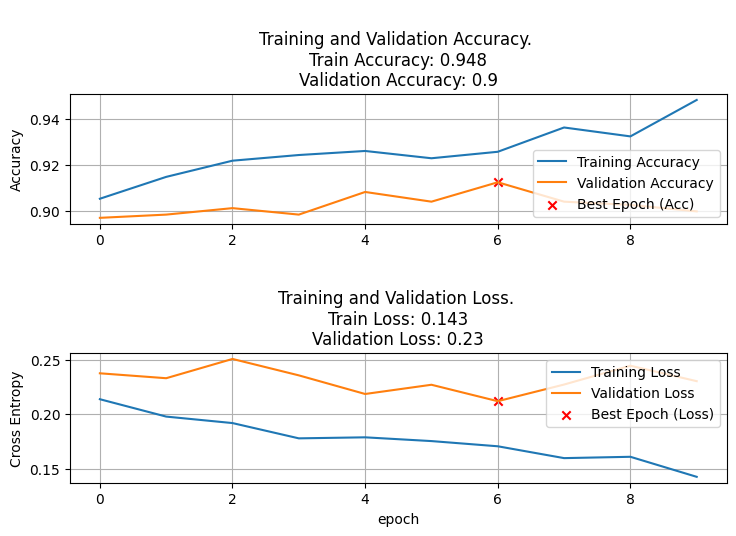

In [ ]:
plot_history(history)

13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 434ms/step

Relatório de Classificação - Modelo Xception (após Fine-tuning):
              precision    recall  f1-score   support

    Negative       0.92      0.93      0.93       256
    Positive       0.87      0.85      0.86       137

    accuracy                           0.91       393
   macro avg       0.90      0.89      0.90       393
weighted avg       0.91      0.91      0.91       393



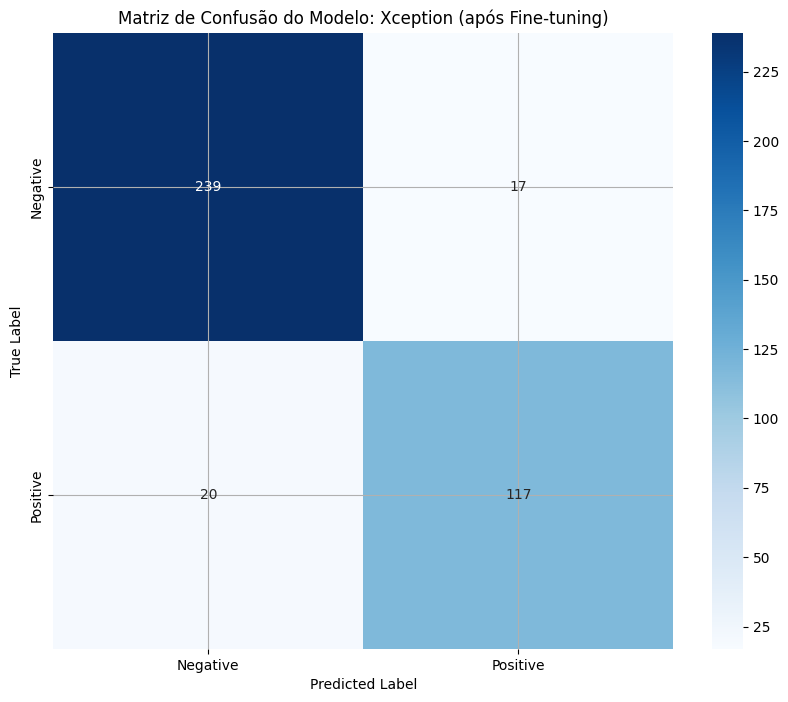

In [ ]:
Relatorio = generate_report(xception_model, test_generator, class_names, "Xception (após Fine-tuning)")

In [ ]:
# Avaliar o modelo no conjunto de testes usando o gerador de dados de teste.
accuracy_score = xception_model.evaluate(test_generator)

# O 'evaluate' retorna uma lista com a perda e a precisão
# O primeiro valor (accuracy_score[0]) é a perda
# O segundo valor (accuracy_score[1]) é a precisão (accuracy)

# Imprimir o valor da precisão e da perda
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))  # Precisão (accuracy)
print("Loss: {:.3f}".format(accuracy_score[0]))  # Perda (loss)

13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 292ms/step - accuracy: 0.9088 - loss: 0.2258
Accuracy: 90.59%
Loss: 0.229


In [ ]:
# Reiniciar o gerador de dados de teste para garantir que as previsões sejam feitas na ordem correta
test_generator.reset()

# Realizar as previsões com o modelo para o conjunto de teste
xception_test_preds = xception_model.predict(test_generator)

# Encontrar a classe com a maior probabilidade para cada imagem
# 'axis=1' significa que estamos selecionando a classe com maior probabilidade para cada exemplo
xception_test_pred_classes = np.argmax(xception_test_preds, axis=1)

# xception_test_pred_classes agora contém as classes previstas para cada imagem no conjunto de teste

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step


In [ ]:
# Calcular a curva ROC para o modelo Xception
# xception_test_preds[:,1] é para pegar as probabilidades da classe positiva
fpr_xception, tpr_xception, thresholds_xception = roc_curve(test_generator.classes, xception_test_preds[:, 1])

# Calcular a área sob a curva (AUC)
auc_xception = auc(fpr_xception, tpr_xception)

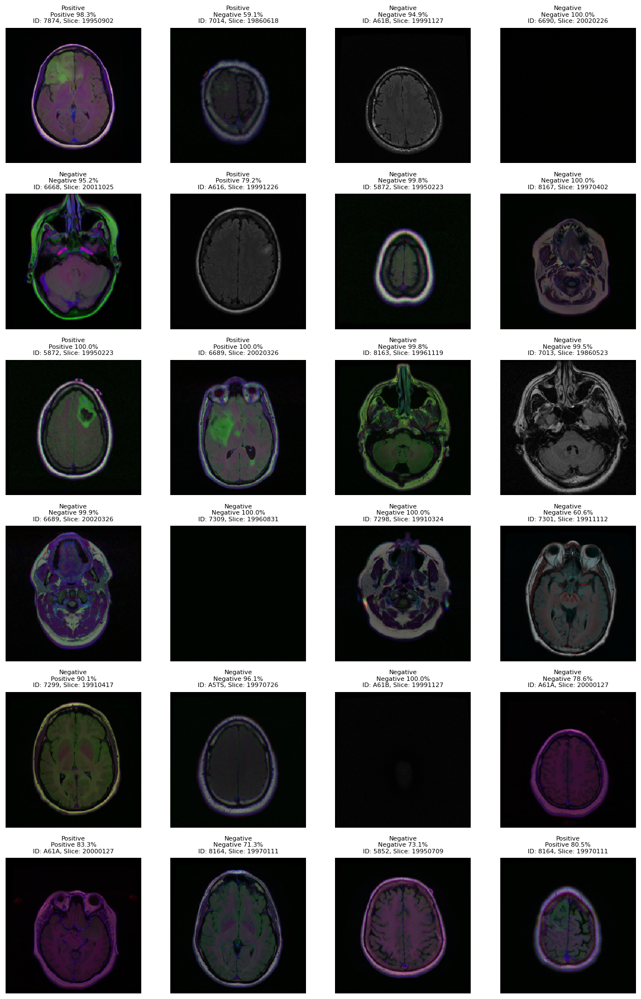

In [ ]:
# Reset o gerador de dados de teste (test_generator) para garantir que ele percorra todas as imagens novamente
# sem embaralhar a ordem. Isso é importante para garantir que a visualização dos resultados corresponda
# às imagens que estamos exibindo, e para não perdermos o mapeamento entre as imagens e as previsões.
test_generator.reset()

# Obtém um lote de imagens (x) e os rótulos verdadeiros (y) do gerador de dados de teste.
# `next(test_generator)` retorna uma tupla (imagens, rótulos), onde `x` são as imagens e `y` são os rótulos.
x, y = next(test_generator)


# Exibe as imagens junto com os rótulos verdadeiros (y) e as previsões do modelo (vgg16_test_preds).
# O `plot_images` é uma função personalizada (que você deve ter implementado) que provavelmente plota as imagens
# com as informações associadas a elas, como rótulos verdadeiros e previsões.
# As previsões do modelo (vgg16_test_preds) são usadas para mostrar qual classe o modelo previu para cada imagem.
plot_images_with_metadata(x, y, xception_test_preds, filenames = filenames)

<ipython-input-24-cee0e4c66c32>:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


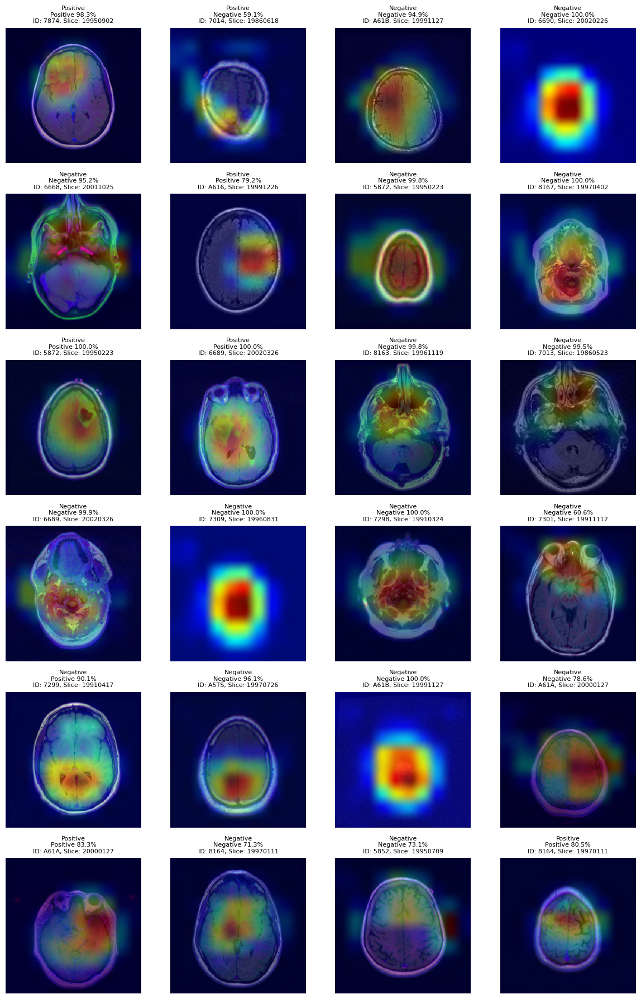

In [ ]:
last_conv_layer_name = "block14_sepconv2_act"

heatmaps = [] # Inicializar uma lista para armazenar os mapas de calor gerados para cada imagem

#Gera heat maps para cada imagem
for img in x:
    heatmap = make_gradcam_heatmap(img, xception_model, last_conv_layer_name)
    heatmaps.append(heatmap) #Adicionar o mapa de calor gerado à lista

# Plotar as imagens com os heatmaps sobrepostos e toda a informação necessária
plot_images_with_metadata(heatmaps, y, xception_test_preds, filenames = filenames)

##Confusion matrix comparation

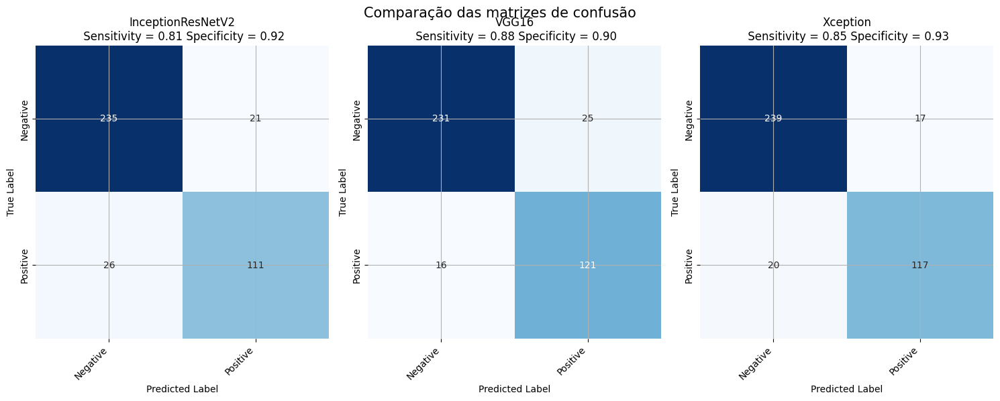

In [ ]:
# Mostrar as matrizes de confusao de cada um dos modelos para comparar os desempenhos.
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 8)) # Cria uma figura com 3 subplots dispostos em uma única linha

true_classes = test_generator.classes # Obtemos as classes verdadeiras do gerador de dados de teste

plot_confusion_matrix(true_classes, inception_test_pred_classes, class_names, ax1, title = "InceptionResNetV2") # Plota a matriz de confusão para o modelo Inception
# 'inception_test_pred_classes' contém as classes previstas pelo modelo Inception

plot_confusion_matrix(true_classes, vgg16_test_pred_classes, class_names, ax2, title = "VGG16") # Plota a matriz de confusão para o modelo VGG16
# 'vgg16_test_pred_classes' contém as classes previstas pelo modelo VGG16

plot_confusion_matrix(true_classes, xception_test_pred_classes, class_names, ax3, title = "Xception") # Plota a matriz de confusão para o modelo Xception
# 'xception_test_pred_classes' contém as classes previstas pelo modelo Xception

fig.suptitle("Comparação das matrizes de confusão", fontsize = 15)
fig.tight_layout() # Ajusta os layouts dos subplots para evitar sobreposição
fig.subplots_adjust(top=1.25)
plt.show()

##Ensemble

In [ ]:
ensemble_preds = np.add(np.add(inception_test_preds, vgg16_test_preds), xception_test_preds)/3.0

# Combina as predições dos modelos Inception, VGG16 e Xception.
# 'inception_test_preds', 'vgg16_test_preds' e 'xception_test_preds' são arrays com as predições de cada modelo para as classes.
# A função np.add soma dois arrays elemento a elemento.
# A soma das predições dos três modelos é dividida por 3 para calcular a média das predições.

In [ ]:
ensemble_test_pred_classes = np.argmax(ensemble_preds, axis = 1)

# Calcula as classes previstas pelo ensemble
# Para cada imagem no conjunto de teste, `ensemble_preds` contém as probabilidades médias para cada classe,
# calculadas a partir das predições dos três modelos (Inception, VGG16 e Xception).

Relatório de classificação - Ensemble:

              precision    recall  f1-score   support

    Negative       0.95      0.93      0.94       256
    Positive       0.88      0.91      0.90       137

    accuracy                           0.93       393
   macro avg       0.92      0.92      0.92       393
weighted avg       0.93      0.93      0.93       393



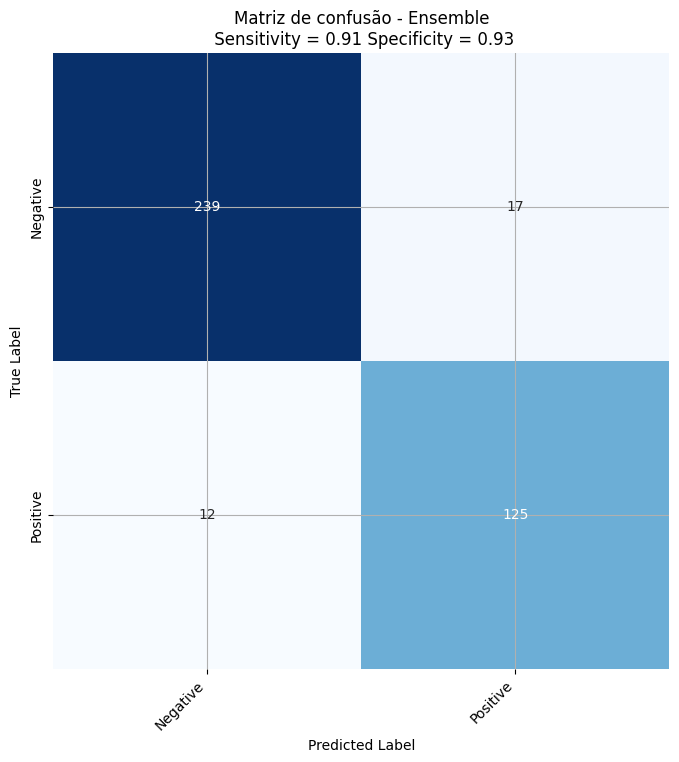

In [ ]:
# Gera o relatório de classificação para o ensemble
ensemble_classification_report = classification_report(true_classes, ensemble_test_pred_classes, target_names=class_names)

# Imprime o relatório de classificação
print("Relatório de classificação - Ensemble:\n")
print(ensemble_classification_report)

# Matriz de confusão
fig, ax = plt.subplots(figsize=(10, 8))
plot_confusion_matrix(true_classes, ensemble_test_pred_classes, class_names, ax, title="Matriz de confusão - Ensemble")
plt.show()

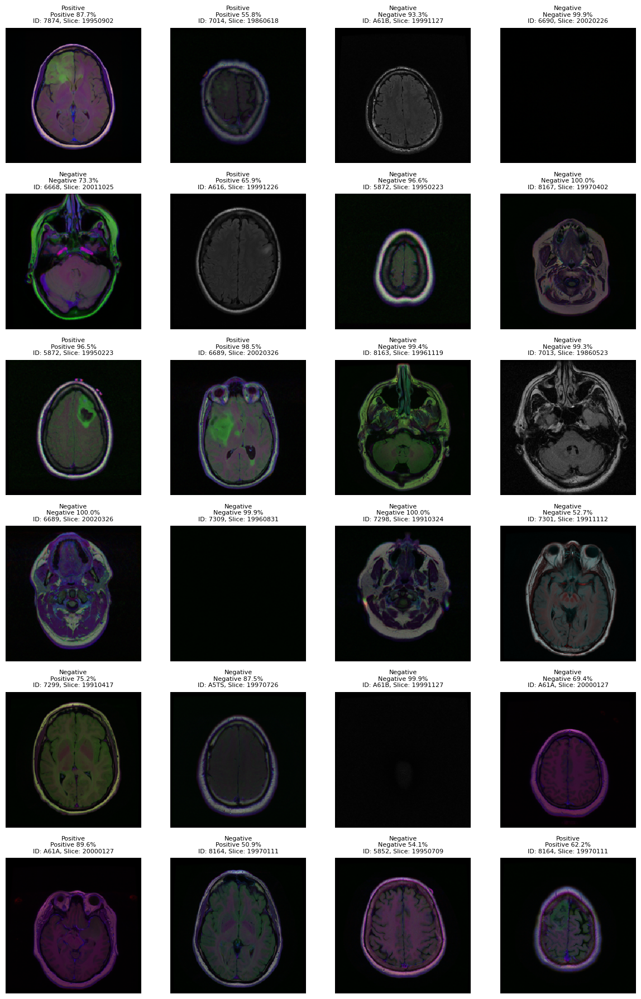

In [ ]:
# Reseta o gerador de teste para garantir que ele retorne as imagens na ordem original
# e que nenhuma imagem seja omitida ou repetida durante a predição.
test_generator.reset()

# Obtém o próximo lote de imagens (x) e seus rótulos verdadeiros (y) do gerador de teste.
# `next(test_generator)` retorna um lote de imagens e rótulos baseado na configuração do gerador.
# O tamanho do lote depende do parâmetro `batch_size` definido no gerador.
x, y = next(test_generator)

# Chama a função personalizada `plot_images_with_metadata` para exibir as imagens junto com as informações de metadados.
plot_images_with_metadata(x, y, ensemble_preds, filenames=filenames)

In [ ]:
# Calcula as taxas de falso positivo (FPR), verdadeiro positivo (TPR) e os thresholds
# para a curva ROC (Receiver Operating Characteristic) do ensemble.
# - `test_generator.classes`: Contém as classes verdadeiras do conjunto de teste.
# - `ensemble_preds[:, 1]`: Probabilidades preditas pelo ensemble para a classe positiva
fpr_ensemble, tpr_ensemble, thresholds_ensemble = roc_curve(test_generator.classes, ensemble_preds[:, 1])

# Calcula a área sob a curva ROC (AUC) usando as taxas FPR e TPR calculadas.
# A AUC representa a capacidade do modelo de distinguir entre as classes.
auc_ensemble = auc(fpr_ensemble, tpr_ensemble)

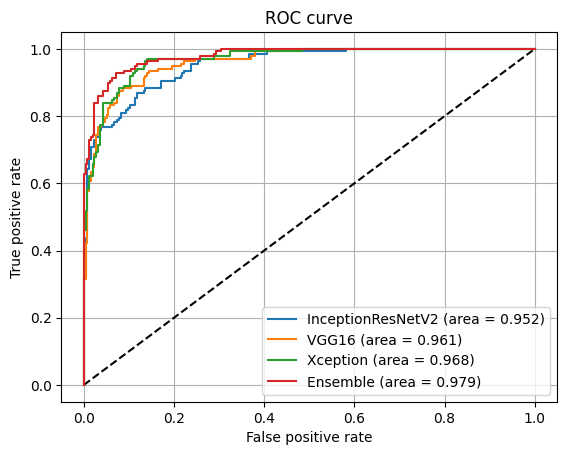

In [ ]:
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_inception, tpr_inception, label='InceptionResNetV2 (area = {:.3f})'.format(auc_inception))
plt.plot(fpr_vgg16, tpr_vgg16, label='VGG16 (area = {:.3f})'.format(auc_vgg16))
plt.plot(fpr_xception, tpr_xception, label='Xception (area = {:.3f})'.format(auc_xception))
plt.plot(fpr_ensemble, tpr_ensemble, label='Ensemble (area = {:.3f})'.format(auc_ensemble))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()